## Imports

In [15]:
from monai.utils import first, set_determinism
from monai.transforms import (
    Compose,
    AddChanneld,
    LoadImaged,
    Resized,
    ToTensord,
    Spacingd,
    Orientationd,
    ScaleIntensityRanged,
    CropForegroundd,
    Activations,
)
from monai.networks.nets import UNet
from monai.networks.layers import Norm
from monai.data import DataLoader, Dataset
import torch
import matplotlib.pyplot as plt
import os
from glob import glob
import numpy as np
from monai.inferers import sliding_window_inference

In [16]:
in_dir = 'C:\\Users\\ChiaraFreistetter\\Desktop\\fh\\inno-organ_segmentation\\data\\testRun1'
model_dir = 'C:\\Users\\ChiaraFreistetter\\Desktop\\fh\\inno-organ_segmentation\\results'

In [17]:
path_train_volumes = sorted(glob(in_dir + "\\imagesTr\\**\\*.nii"))
path_train_segmentation = sorted(glob(in_dir + "\\labelsTr\\**\\*.nii"))

path_validation_volumes = sorted(glob(in_dir + "\\imagesTest\\**\\*.nii"))
path_validation_segmentation = sorted(glob(in_dir + "\\labelsTest\\**\\*.nii"))

In [18]:
validation_files = [{"vol": image_name, "seg": label_name} for image_name, label_name in zip(path_validation_volumes, path_validation_segmentation)]
validation_files = validation_files[0:9]

validation_transforms = Compose(
    [
        LoadImaged(keys=["vol", "seg"]),
        AddChanneld(keys=["vol", "seg"]),
        Spacingd(keys=["vol", "seg"], pixdim=(1.5, 1.5, 1.0), mode=("bilinear", "nearest")),
        Orientationd(keys=["vol", "seg"], axcodes="RAS"),
        ScaleIntensityRanged(keys=["vol"], a_min=-200, a_max=200,b_min=0.0, b_max=1.0, clip=True),
        CropForegroundd(keys=['vol', 'seg'], source_key='vol'),
        Resized(keys=["vol", "seg"], spatial_size=[128, 128, 64]),
        ToTensord(keys=["vol", "seg"]),
    ]
)

In [19]:
validation_ds = Dataset(data=validation_files, transform=validation_transforms)
validation_loader = DataLoader(validation_ds, batch_size=1)
# aug gpu berechnen
device = torch.device("cuda:0")
# model definieren
model = UNet(
    dimensions=3,
    in_channels=1,
    out_channels=2,
    channels=(16, 32, 64, 128, 256),
    strides=(2, 2, 2, 2),
    num_res_units=2,
    norm=Norm.BATCH,
).to(device)
# anders als beim training wollen wir hier hald das gespeicherte model verwenden
model.load_state_dict(torch.load(
    os.path.join(model_dir, "best_metric_model.pth")))
model.eval()

sw_batch_size = 4
roi_size = (128, 128, 512)

# Original Image and Label to comare with the Algorhytm
##do not run cells --> results are for comparison

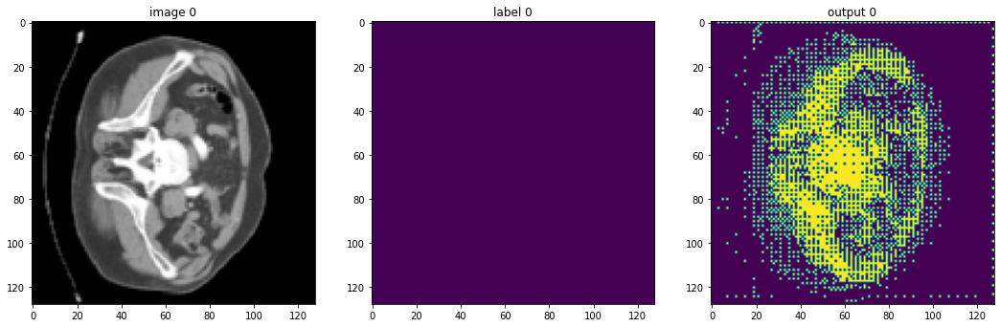

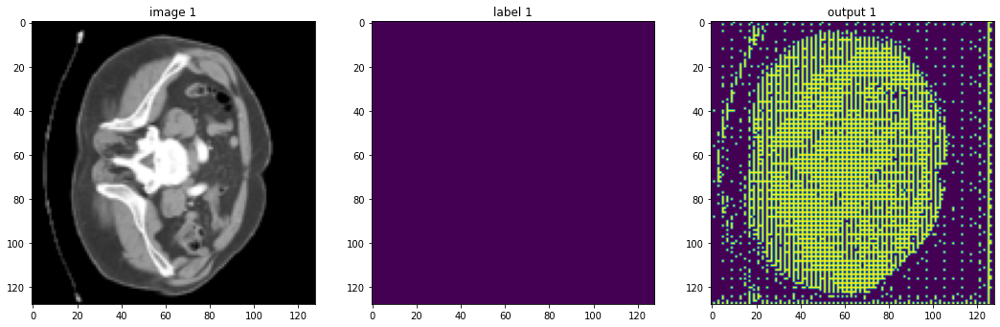

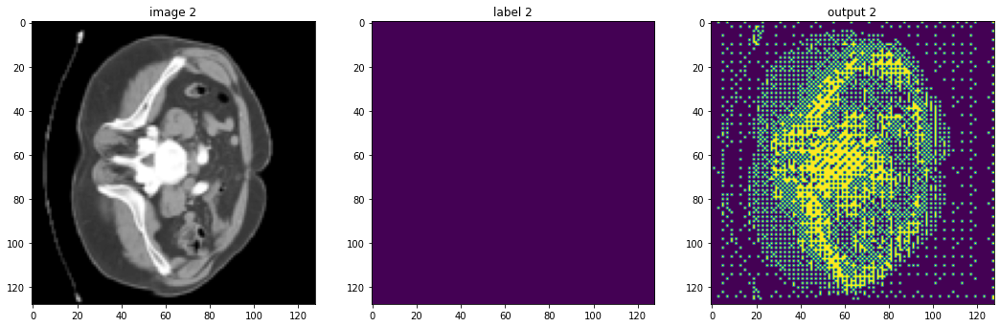

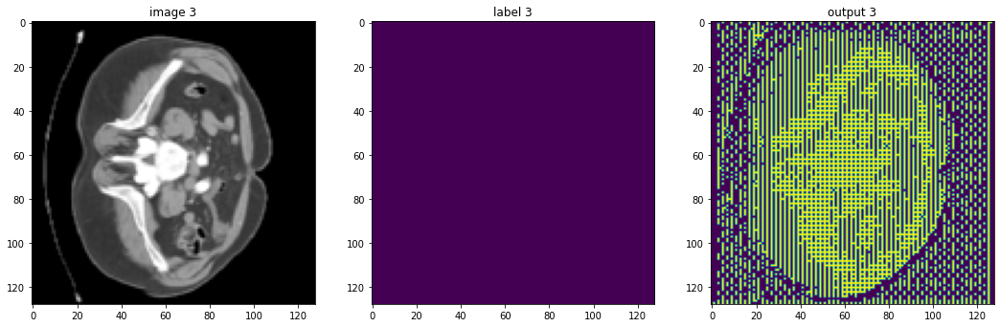

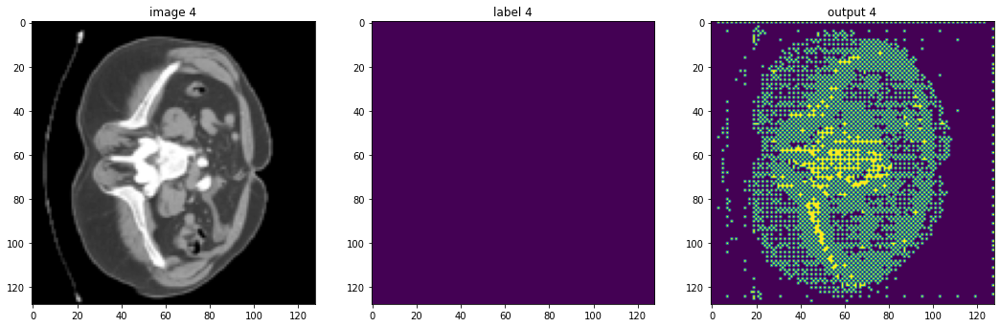

...

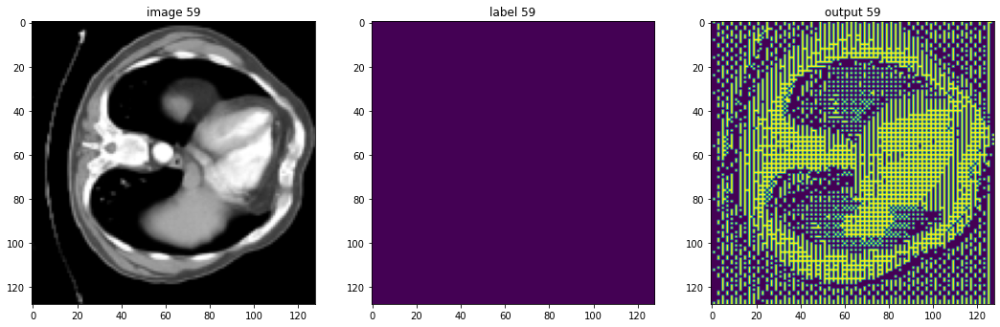

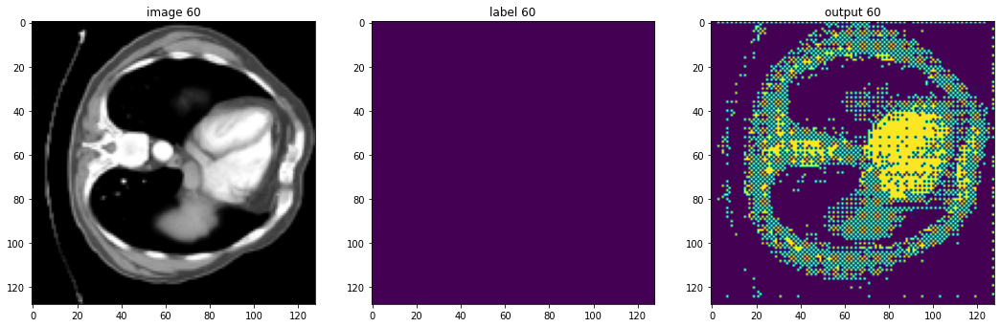

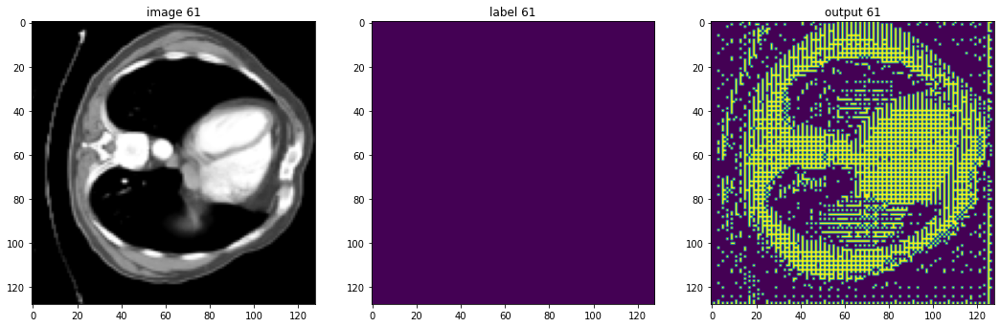

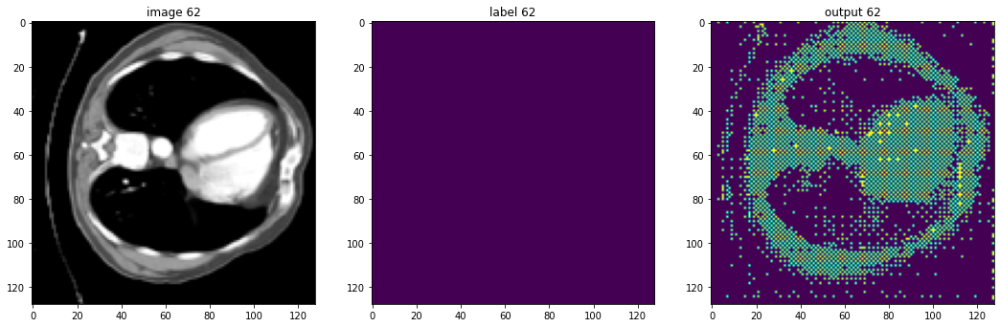

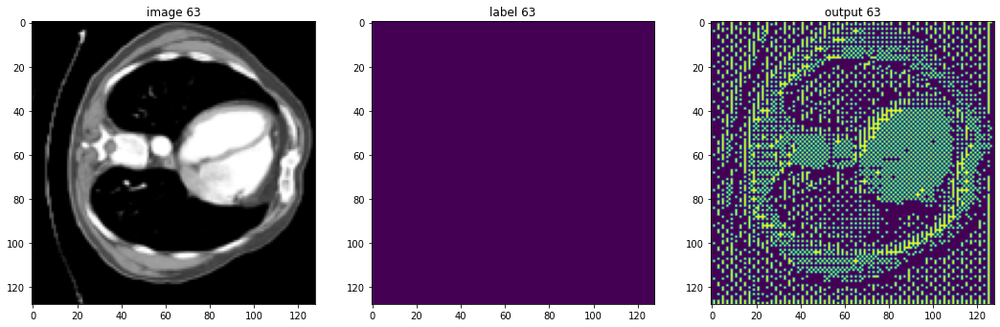

IndexError: index 64 is out of bounds for dimension 4 with size 64

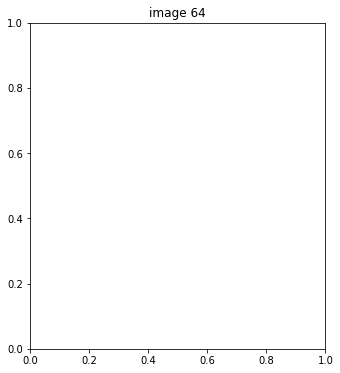

In [19]:
# first semester result (do not run this cell!!)
with torch.no_grad():
    validation_patient = first(validation_loader)
    t_volume = validation_patient["vol"]

    validation_outputs = sliding_window_inference(t_volume.to(device), roi_size, sw_batch_size, model)
    sigmoid_activation = Activations(sigmoid=True)
    validation_outputs = sigmoid_activation(validation_outputs)
    validation_outputs = validation_outputs > 0.53

    for i in range(512):
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(validation_patient["vol"][0, 0, :, :, i], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"label {i}")
        plt.imshow(validation_patient["seg"][0, 0, :, :, i] != 0)
        plt.subplot(1, 3, 3)
        plt.title(f"output {i}")
        plt.imshow(validation_outputs.detach().cpu()[0, 1, :, :, i])
        plt.show()

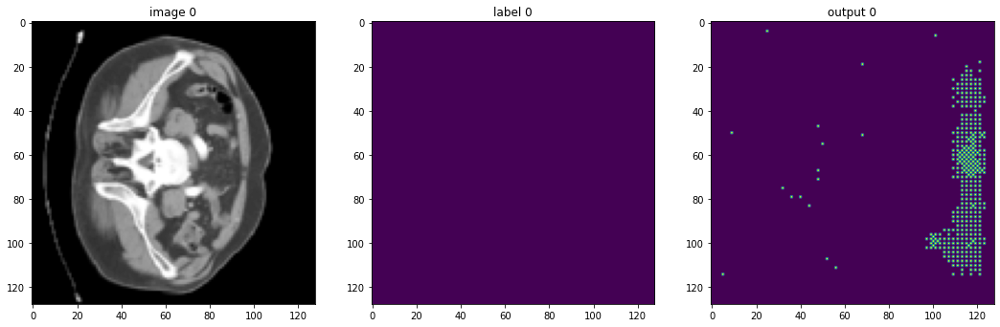

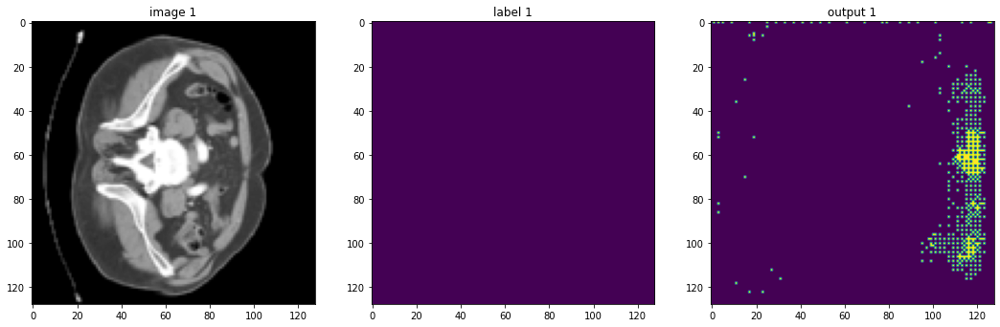

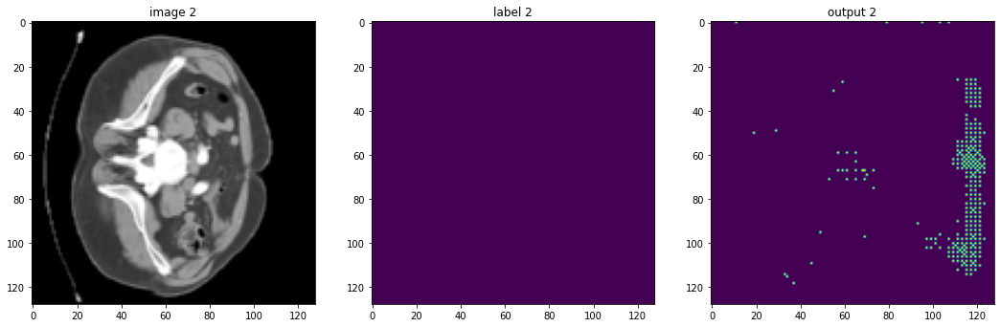

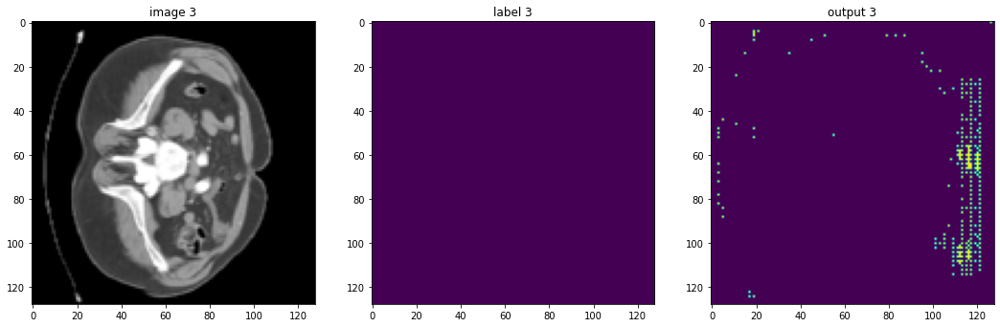

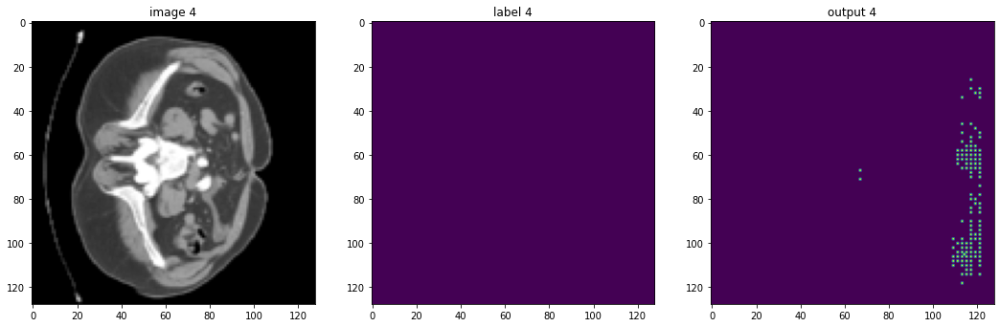

...

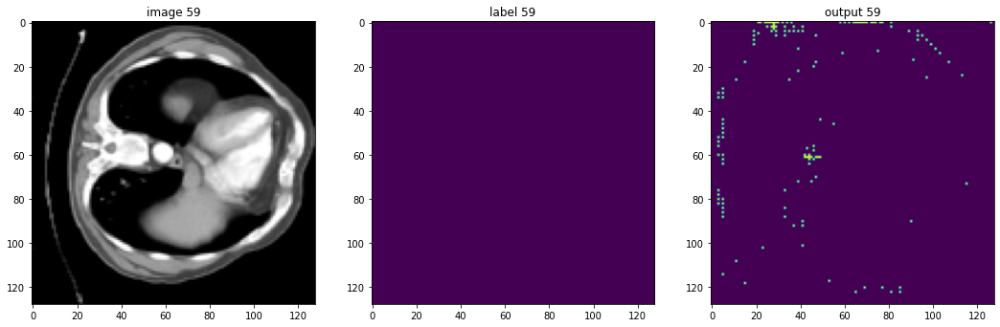

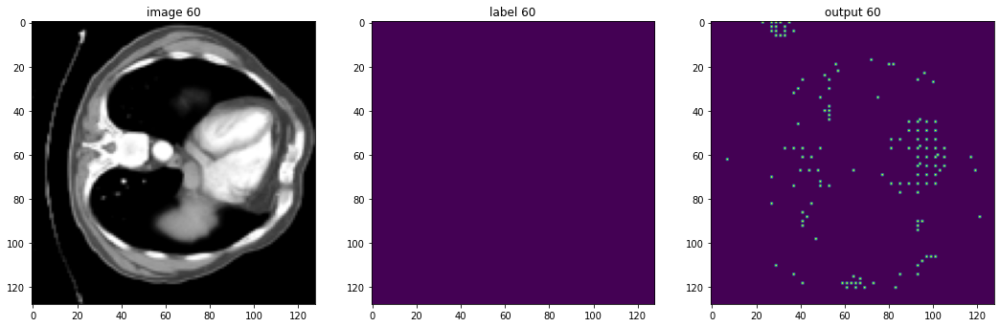

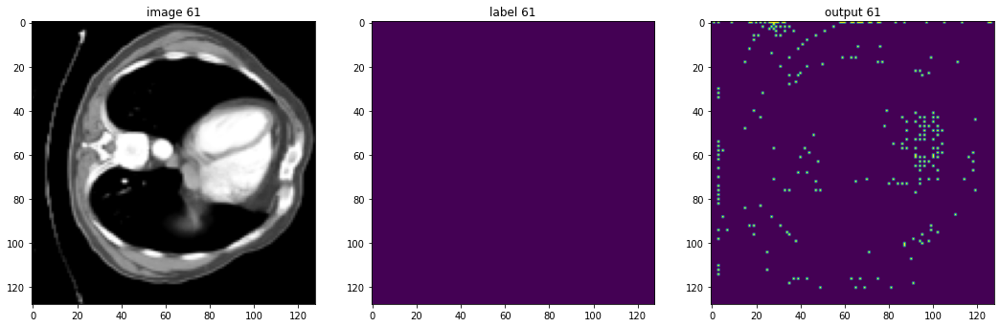

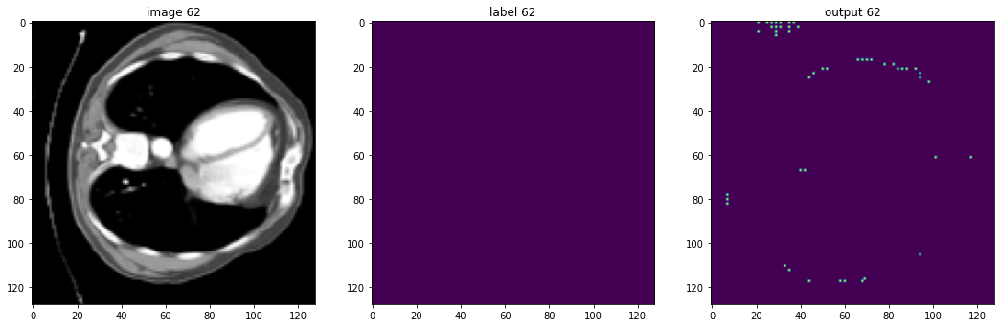

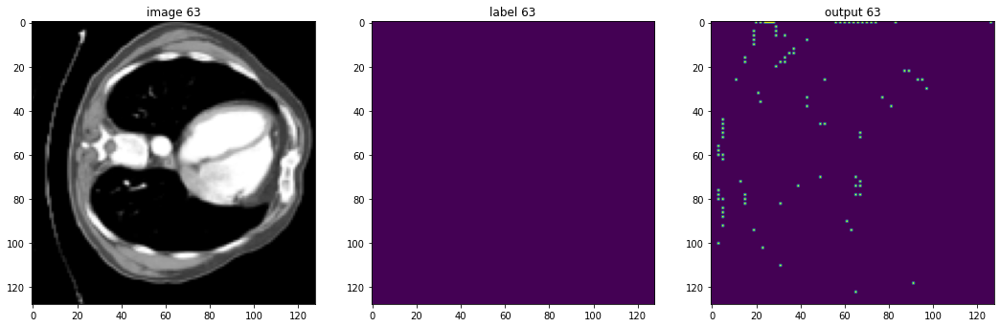

IndexError: index 64 is out of bounds for dimension 4 with size 64

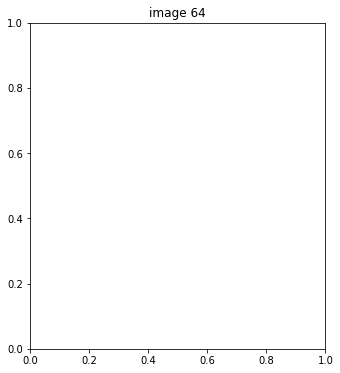

In [20]:
# this is the only cell we run --> it shows current model!
with torch.no_grad():
    validation_patient = first(validation_loader)
    t_volume = validation_patient["vol"]

    validation_outputs = sliding_window_inference(t_volume.to(device), roi_size, sw_batch_size, model)
    sigmoid_activation = Activations(sigmoid=True)
    validation_outputs = sigmoid_activation(validation_outputs)
    validation_outputs = validation_outputs > 0.53

    for i in range(512):
        plt.figure("check", (18, 6))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(validation_patient["vol"][0, 0, :, :, i], cmap="gray")
        plt.subplot(1, 3, 2)
        plt.title(f"label {i}")
        plt.imshow(validation_patient["seg"][0, 0, :, :, i] != 0)
        plt.subplot(1, 3, 3)
        plt.title(f"output {i}")
        plt.imshow(validation_outputs.detach().cpu()[0, 1, :, :, i])
        plt.show()